<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#General-functions" data-toc-modified-id="General-functions-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>General functions</a></span></li><li><span><a href="#Approximating-spherical-Voronoi-areas" data-toc-modified-id="Approximating-spherical-Voronoi-areas-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Approximating spherical Voronoi areas</a></span><ul class="toc-item"><li><span><a href="#Plotting" data-toc-modified-id="Plotting-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Plotting</a></span></li><li><span><a href="#Reference-calculation" data-toc-modified-id="Reference-calculation-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Reference calculation</a></span></li><li><span><a href="#Super-simple-approximation" data-toc-modified-id="Super-simple-approximation-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Super simple approximation</a></span></li><li><span><a href="#Simple-approximation" data-toc-modified-id="Simple-approximation-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Simple approximation</a></span></li><li><span><a href="#Detailed-approximation" data-toc-modified-id="Detailed-approximation-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Detailed approximation</a></span></li></ul></li><li><span><a href="#Returning-to-hyperspheres" data-toc-modified-id="Returning-to-hyperspheres-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Returning to hyperspheres</a></span><ul class="toc-item"><li><span><a href="#Plotting" data-toc-modified-id="Plotting-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Plotting</a></span></li><li><span><a href="#Simple-&amp;-Detailed-approximation" data-toc-modified-id="Simple-&amp;-Detailed-approximation-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Simple &amp; Detailed approximation</a></span></li><li><span><a href="#Double-coverage" data-toc-modified-id="Double-coverage-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Double coverage</a></span></li></ul></li><li><span><a href="#Surface-areas" data-toc-modified-id="Surface-areas-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Surface areas</a></span><ul class="toc-item"><li><span><a href="#Fast-adjacency:-Sphere" data-toc-modified-id="Fast-adjacency:-Sphere-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Fast adjacency: Sphere</a></span></li><li><span><a href="#Fast-adjacency:-Hypersphere" data-toc-modified-id="Fast-adjacency:-Hypersphere-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Fast adjacency: Hypersphere</a></span></li><li><span><a href="#From-adjacency-to-surface-areas" data-toc-modified-id="From-adjacency-to-surface-areas-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>From adjacency to surface areas</a></span></li></ul></li><li><span><a href="#Trial:-SVD-and-k-rank" data-toc-modified-id="Trial:-SVD-and-k-rank-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Trial: SVD and k-rank</a></span></li></ul></div>

In [1]:
import sys
import os

try:
    os.chdir(r"/home/zupanhana/PAPER_MOLECULAR_ROTATIONS_2022/nobackup/molgri")
    sys.path.append(r"/home/zupanhana/PAPER_MOLECULAR_ROTATIONS_2022/nobackup")
except FileNotFoundError:
    os.chdir(r"D:\HANA\phD\PAPER_2022\molecularRotationalGrids")
    sys.path.append(r"D:\HANA\phD\PAPER_2022\molecularRotationalGrids")
    
import warnings
warnings.filterwarnings("ignore")

In [2]:
import numpy as np
from numpy.typing import NDArray
import scipy
from scipy.spatial import _voronoi, SphericalVoronoi
from scipy.spatial.distance import cdist
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from matplotlib.collections import PolyCollection
from scipy.spatial import ConvexHull
from scipy.constants import pi
import seaborn as sns
import matplotlib.pyplot as plt

from molgri.space.polytopes import Cube4DPolytope, IcosahedronPolytope
from molgri.space.rotobj import ConvergenceSphereGridFactory, SphereGridFactory
from molgri.plotting.spheregrid_plots import EightCellsPlot, ArrayPlot
from molgri.plotting.abstract import MultiRepresentationCollection, show_anim_in_jupyter
from molgri.constants import DEFAULT_NS, MINI_NS

from itertools import combinations
from scipy.sparse import coo_array
from molgri.space.fullgrid import FullGrid

# Hypersphere Voronoi

1. generate points on a hypersphere as double-coverage of quaternions you want to use (DONE)
2. determine vertices and regions of Voronoi cells on a full hypersphere based on these points (DONE, scipy can do that)
3. Add extra spherical points in each of these regions for more exact calculations
4. Triangulate (or tetrahondalate the set of vertices and the extra points
5. Add up the triangulated hyper(surfaces) together to get areas
6. Look up areas only for half the quaternions you are interested in

## General functions

In [3]:
# plotting helper functions

def get_all_cell_indices(array_of_4D_points):
    """Returns 8 sub-lists belonging to individual cells of hyper-cube."""
    sublists_of_8_indices = [[]*i for i in range(8)]
    
    for component in range(4):
        neg_el = np.nonzero(array_of_4D_points.T[component] <= 0)
        pos_el = np.nonzero(array_of_4D_points.T[component] >= 0)
        # add indices
        sublists_of_8_indices[component].extend(neg_el[0])
        sublists_of_8_indices[4+component].extend(pos_el[0])
    return sublists_of_8_indices

# todo: get "projected" 3D cells (meaning the representation of unit quaternions with one component cut off)

def get_3d_cells(array_of_4D_points, projected=False):
    sublists_of_8_cells = [[]*i for i in range(8)]
    sublists_of_8_indices = get_all_cell_indices(array_of_4D_points)
    
    if not projected:
        used_4d_points = array_of_4D_points
    else:
        used_4d_points = []
        for point in array_of_4D_points:
            used_4d_points.append(point/np.linalg.norm(point))
        used_4d_points = np.array(used_4d_points)
    # add 3D points
    for component in range(4):
        # first four
        points_4D = used_4d_points[sublists_of_8_indices[component]]
        points_3D = np.concatenate([points_4D[:,:component], points_4D[:,component+1:]], axis=1)
        sublists_of_8_cells[component] = points_3D
        # last four
        points_4D = used_4d_points[sublists_of_8_indices[component+4]]
        points_3D = np.concatenate([points_4D[:,:component], points_4D[:, component+1:]], axis=1)
        sublists_of_8_cells[component+4] = points_3D
    return sublists_of_8_cells

In [4]:
# plotting of voronoi hypercubes
class EightPlots(MultiRepresentationCollection):

    def __init__(self, points_4D, projected=False):
        self.points_4D = points_4D
        self.points_3D = get_3d_cells(self.points_4D, projected=projected)
        list_plots = [ArrayPlot("array", my_array=subpoly) for subpoly in self.points_3D]
        super().__init__(data_name=f"points_4D",
                         list_plots=list_plots, n_rows=2, n_columns=4)
    
    def plot_all_nodes(self, animate_rot=False, save=True, c="black", all_ax=None, fig=None, **kwargs):
        #print(fig, all_ax)
        self._make_plot_for_all("make_grid_plot", projection="3d", plotting_kwargs={"c": c}, 
                                fig=fig, all_ax=all_ax)
        for subax in self.all_ax.ravel():
            subax.set_xlim(-1, 1)
            subax.set_ylim(-1, 1)
            subax.set_zlim(-1, 1)
        if animate_rot:
            return self.animate_figure_view("points", dpi=100)
        if save:
            self._save_multiplot("points", dpi=100)

In [5]:
# How can we improve estimates?
# you could add more points just for area calculation
# for example do a really detailed hypercube once and then add points that are within ConvexHull 
# of a particular point to the determined vertices

detailed_hypercube = Cube4DPolytope()
detailed_hypercube.divide_edges()
detailed_hypercube.divide_edges()
detailed_hypercube.divide_edges()
detailed_hypercube_points = np.array([d["projection"] for n, d in detailed_hypercube.G.nodes(data=True)])
print(f"There are {len(detailed_hypercube_points)} points in detailed hypercube.")

There are 4160 points in detailed hypercube.


In [6]:
# in 3D improving predictions with extra points
detailed_ico = IcosahedronPolytope()
detailed_ico.divide_edges()
detailed_ico.divide_edges()
detailed_ico.divide_edges()
detailed_ico.divide_edges()
detailed_ico_points = np.array([d["projection"] for n, d in detailed_ico.G.nodes(data=True)])
print(f"There are {len(detailed_ico_points)} points in detailed icosahedron.")

There are 2562 points in detailed icosahedron.


In [7]:
def areas_on_sphere(sphere_points: NDArray, using_detailed_grid: bool = True, 
                    print_estimate: bool = False) -> NDArray:
    """
    This function enables the numerical approximation of Voronoi (hyper)areas on spheres or hyperspheres.
    """
    # determine if dealing with 3D or 4D grids
    dimensionality = sphere_points.shape[1]
    if dimensionality == 3:
        dense_points = detailed_ico_points
        sphere_area = 4*pi
    elif dimensionality == 4:
        dense_points = detailed_hypercube_points
        sphere_area = 2*pi**2
    else:
        raise ValueError("Select dim 3 or 4")
    
    # now estimate areas
    all_estimated_areas = []
    voronoi_cells = SphericalVoronoi(sphere_points)
    all_vertices = [voronoi_cells.vertices[region] for region in voronoi_cells.regions]
    
    # for more precision, assign detailed grid points to closest sphere points
    if using_detailed_grid:
        extra_points_belongings = np.argmin(cdist(dense_points, sphere_points, metric="cos"), axis=1)
    
    for point_index, point in enumerate(sphere_points):
        vertices = all_vertices[point_index]
        if using_detailed_grid:
            region_vertices_and_point = np.vstack([dense_points[extra_points_belongings==point_index], vertices])
        else:
            region_vertices_and_point = np.vstack([point, vertices])
        my_convex_hull = ConvexHull(region_vertices_and_point, qhull_options='QJ')
        all_estimated_areas.append(my_convex_hull.area/2)
        
    if print_estimate:
        N_points = len(sphere_points)
        print(f"Area of a sphere is {sphere_area}, divided into {N_points} parts {sphere_area/N_points}")
        print(f"Estimation detailed grid={using_detailed_grid}:", np.sum(all_estimated_areas), np.average(all_estimated_areas))
    return np.array(all_estimated_areas)

## Approximating spherical Voronoi areas

Since scipy has no function for areas of hyperspherical Voronoi, we would like to learn how to approximate those areas with triangulation and numerical integration.

In [8]:
# creating a 3D example
ico = IcosahedronPolytope()
ico.divide_edges()
example_3D_points = ico.get_N_ordered_points(42)
voronoi_cells_3d = SphericalVoronoi(example_3D_points)
voronoi_cells_3d.sort_vertices_of_regions()

### Plotting

In [9]:
# plot points on a sphere in black
ap_3d = ArrayPlot("ico", example_3D_points)
ap_3d.make_grid_plot(c="black", save=False, animate_rot=False)
# plot voronoi vertices in red
ap_3d_vor = ArrayPlot("ico_vor", voronoi_cells_3d.vertices)
ani = ap_3d_vor.make_grid_plot(c="red", fig=ap_3d.fig, ax=ap_3d.ax, save=False, animate_rot=True)
show_anim_in_jupyter(ani)

In [10]:
# now let us focus on one specific region
region_index = 0
region_point = example_3D_points[region_index]
region_vertices = voronoi_cells_3d.vertices[voronoi_cells_3d.regions[region_index]]
# 3D indices of this region
print("Vertices of the region: \n", region_vertices)

Vertices of the region: 
 [[-0.77786752  0.62842829  0.        ]
 [-0.58312878  0.74878345 -0.3150939 ]
 [-0.26803488  0.94352219 -0.19473874]
 [-0.26803488  0.94352219  0.19473874]
 [-0.58312878  0.74878345  0.3150939 ]]


In [11]:
# let's plot this region
polygon = Poly3DCollection([region_vertices,], alpha=0.5)
ap_3d.ax.add_collection3d(polygon)
ap_3d_vor = ArrayPlot("ico_vor", voronoi_cells_3d.vertices)
ani = ap_3d_vor.make_grid_plot(c="red", fig=ap_3d.fig, ax=ap_3d.ax, save=False, animate_rot=True)
show_anim_in_jupyter(ani)

The regon we are looking at is a curved polyhedron. We don't want to consider curves, but we can approximate the curved surface at different levels of precision
- super simple approximation: consider only a flat polyhedron
- simple approximation: add up the areas of triangles created by connecting the point with vertices
- detailed approximation: add extra points within this spherical region, triangulate them all and add up areas

### Reference calculation

In [13]:
N_points = len(example_3D_points)
print(f"Area of a sphere is {4*pi}, divided into {N_points} parts {4*pi/N_points}")
print(f"Exact Voronoi calculation of this region gives {voronoi_cells_3d.calculate_areas()[region_index]}.")

Area of a sphere is 12.566370614359172, divided into 42 parts 0.2991993003418851
Exact Voronoi calculation of this region gives 0.27384421774825846.


### Super simple approximation

In [14]:
my_convex_hull = ConvexHull(region_vertices, qhull_options='QJ')
print(f"Super simple approximation of this region gives {my_convex_hull.area/2}.")

Super simple approximation of this region gives 0.2609838767794932.


### Simple approximation

In [15]:
# now we add the point to the  convex hull
region_vertices_and_point = np.vstack([region_point, region_vertices])
my_convex_hull = ConvexHull(region_vertices_and_point, qhull_options='QJ')
print(f"A simple approximation of this region gives {my_convex_hull.area/2}.")

A simple approximation of this region gives 0.26384927181768414.


### Detailed approximation

In [16]:
# now we add a whole bunch of extra triangulation points
# first check which are closest to this region
belongings = np.argmin(cdist(detailed_ico_points, example_3D_points, metric="cos"), axis=1)
# then add them
region_vertices_and_point = np.vstack([detailed_ico_points[belongings==region_index], region_vertices])
my_convex_hull = ConvexHull(region_vertices_and_point, qhull_options='QJ')
print(f"A detailed approximation of this region gives {my_convex_hull.area/2}.")

A detailed approximation of this region gives 0.27061628323178505.


In [17]:
# apply this to all Voronoi regions
normal_ico = IcosahedronPolytope()
#normal_ico.divide_edges()
normal_ico_points = np.array([d["projection"] for n, d in normal_ico.G.nodes(data=True)])
ico_areas = areas_on_sphere(normal_ico_points, using_detailed_grid=True, print_estimate=True)

Area of a sphere is 12.566370614359172, divided into 12 parts 1.0471975511965976
Estimation detailed grid=True: 12.264304572114655 1.0220253810095545


For 10 points, average area is 1.2899024187404673, ideal would be 1.2566370614359172
For 12 points, average area is 1.0220253810095545, ideal would be 1.0471975511965976
For 15 points, average area is 0.832409518541115, ideal would be 0.8377580409572781
For 18 points, average area is 0.7015536123756448, ideal would be 0.6981317007977318
For 23 points, average area is 0.5561175971119786, ideal would be 0.5463639397547466
For 30 points, average area is 0.4321127470990605, ideal would be 0.41887902047863906
For 34 points, average area is 0.3729563393115789, ideal would be 0.36959913571644626
For 41 points, average area is 0.30592489082898083, ideal would be 0.30649684425266277
For 50 points, average area is 0.2511523106737386, ideal would be 0.25132741228718347
For 62 points, average area is 0.20538146648398217, ideal would be 0.2026833970057931
For 75 points, average area is 0.1693489947741095, ideal would be 0.16755160819145562
For 100 points, average area is 0.12729885363092264, ideal 

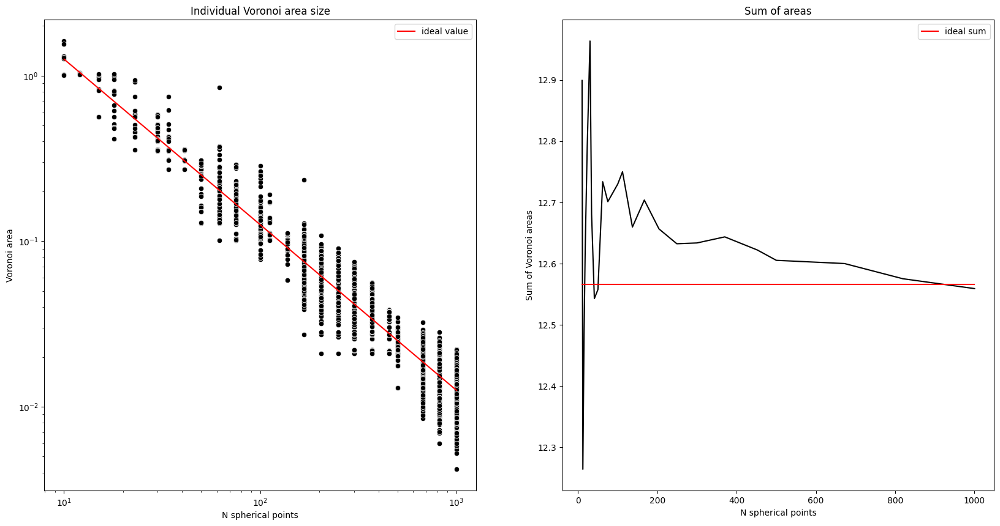

In [18]:
# check for convergence
all_Ns = []
all_areas = []
my_set_of_icos = ConvergenceSphereGridFactory("ico", 3, N_set=DEFAULT_NS).create()
for my_ico in my_set_of_icos:
    my_areas = areas_on_sphere(my_ico.get_grid_as_array(), using_detailed_grid=True, print_estimate=False)
    N = my_ico.get_N()
    all_Ns.append(N)
    all_areas.append(my_areas)
    print(f"For {N} points, average area is {np.average(my_areas)}, ideal would be {4*pi/N}")

# plotting
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
all_Ns = np.array(all_Ns)
for N, area in zip(all_Ns, all_areas):
    sns.scatterplot(x=N, y=area, color="black", ax=ax[0])
sns.lineplot(x=all_Ns, y=4*pi/all_Ns, color="red", label="ideal value", ax=ax[0])
ax[0].set_yscale("log")
ax[0].set_xscale("log")
ax[0].set_title("Individual Voronoi area size")
ax[1].set_title("Sum of areas")
sns.lineplot(x=all_Ns, y=[np.sum(x) for x in all_areas], color="black", ax=ax[1])
sns.lineplot(x=all_Ns, y=4*pi, color="red", label="ideal sum", ax=ax[1])
ax[0].set_xlabel("N spherical points")
ax[1].set_xlabel("N spherical points")
ax[0].set_ylabel("Voronoi area")
ax[1].set_ylabel("Sum of Voronoi areas")
plt.show()

## Returning to hyperspheres

In [19]:
simple_hypercube = Cube4DPolytope()
hypercube_points = np.array([d["projection"] for n, d in simple_hypercube.G.nodes(data=True)])
hyper_voronoi = SphericalVoronoi(hypercube_points)

### Plotting

In [20]:
ep = EightPlots(hypercube_points, projected=True)
ep.plot_all_nodes(save=False)

ep2 = EightPlots(hyper_voronoi.vertices)
ani = ep2.plot_all_nodes(save=False, all_ax=ep.all_ax, fig=ep.fig, c="red", animate_rot=True)
show_anim_in_jupyter(ani)

In [22]:
# larger example
divided_hypercube = Cube4DPolytope()
divided_hypercube.divide_edges()
divided_hypercube_points = np.array([d["projection"] for n, d in divided_hypercube.G.nodes(data=True)])

divided_hyper_voronoi = SphericalVoronoi(divided_hypercube_points)

divided_ep = EightPlots(divided_hypercube_points, projected=True)
divided_ep.plot_all_nodes(save=False)

divided_ep2 = EightPlots(divided_hyper_voronoi.vertices)
ani = divided_ep2.plot_all_nodes(save=False, all_ax=divided_ep.all_ax, fig=divided_ep.fig, c="red", animate_rot=True)
show_anim_in_jupyter(ani)

### Simple & Detailed approximation

In [25]:
# calculating a single region
hypercube = Cube4DPolytope()
hypercube.divide_edges()
hypercube_points = np.array([d["projection"] for n, d in hypercube.G.nodes(data=True)])
hypercube_voronoi = SphericalVoronoi(hypercube_points)

# decide on a region
region_index = 0
region_point = hypercube_points[region_index]
region_vertices = hypercube_voronoi.vertices[hypercube_voronoi.regions[region_index]]

# expectation
print(f"Ideally, each area of the hypersphere would be {2*pi**2/len(hypercube_points)}")

# simple calculation
region_vertices_and_point = np.vstack([region_point, region_vertices])
my_convex_hull = ConvexHull(region_vertices_and_point, qhull_options='QJ')
print(f"A simple approximation of this region of hypercube gives {my_convex_hull.area/2}.")

# detailed calculation
belongings = np.argmin(cdist(detailed_hypercube_points, hypercube_points, metric="cos"), axis=1)
# then add them
region_vertices_and_point = np.vstack([detailed_hypercube_points[belongings==region_index], region_vertices])
my_convex_hull = ConvexHull(region_vertices_and_point, qhull_options='QJ')
print(f"A detailed approximation of this region gives {my_convex_hull.area/2}.")

Ideally, each area of the hypersphere would be 0.24674011002723395
A simple approximation of this region of hypercube gives 0.16985673884886984.
A detailed approximation of this region gives 0.20773633585219142.


In [26]:
# for many regions
areas_on_sphere(hypercube_points, using_detailed_grid=False, print_estimate=True)
detailed_areas = areas_on_sphere(hypercube_points, using_detailed_grid=True, print_estimate=True)
print(np.unique(np.round(detailed_areas, 5), return_counts=True))

Area of a sphere is 19.739208802178716, divided into 80 parts 0.24674011002723395
Estimation detailed grid=False: 16.67646635966712 0.20845582949583902
Area of a sphere is 19.739208802178716, divided into 80 parts 0.24674011002723395
Estimation detailed grid=True: 19.02809179186805 0.23785114739835062
(array([0.20774, 0.21618, 0.24576, 0.36103]), array([16, 32, 24,  8]))


### Double coverage

Once more we need to deal with the fact that only half of hypersphere interest us. In our case, we can simply only look up areas that we need - of half of the points on a hypersphere.

In [60]:
quaternion_grid = SphereGridFactory().create("cube4D", N=40, dimensions=4)
my_quaternions = quaternion_grid.get_grid_as_array()     #  no double coverage

all_hypercube_points = [quaternion_grid.polytope.G.nodes[n]['projection'] for n in quaternion_grid.polytope.G.nodes]
# find indices of quaternions among all hypercube points
q_index2full_index = dict()
for q_index, q in enumerate(my_quaternions):
    full_index = np.where(np.all(np.isclose(q, all_hypercube_points), axis=1))[0][0]
    q_index2full_index[q_index] = full_index


all_hypercube_areas = areas_on_sphere(np.array(all_hypercube_points), using_detailed_grid=True, print_estimate=False)
quaternion_areas = [all_hypercube_areas[q_index2full_index[i]] for i in range(len(my_quaternions))]

print(np.average(quaternion_areas), np.sum(quaternion_areas), pi**2)
print(np.unique(np.round(quaternion_areas, 5), return_counts=True))

0.23570914356961495 9.428365742784598 9.869604401089358
(array([0.20774, 0.21618, 0.24576, 0.36103]), array([ 8, 15, 14,  3]))


8 16
For 8 points, average area is 1.145362445200639, ideal would be 1.2337005501361697
40 80
For 40 points, average area is 0.23570914356961495, ideal would be 0.24674011002723395
272 544
For 272 points, average area is 0.034830536415561206, ideal would be 0.03628531029812264
2080 4160
For 2080 points, average area is 0.004645610688814112, ideal would be 0.004745002115908345


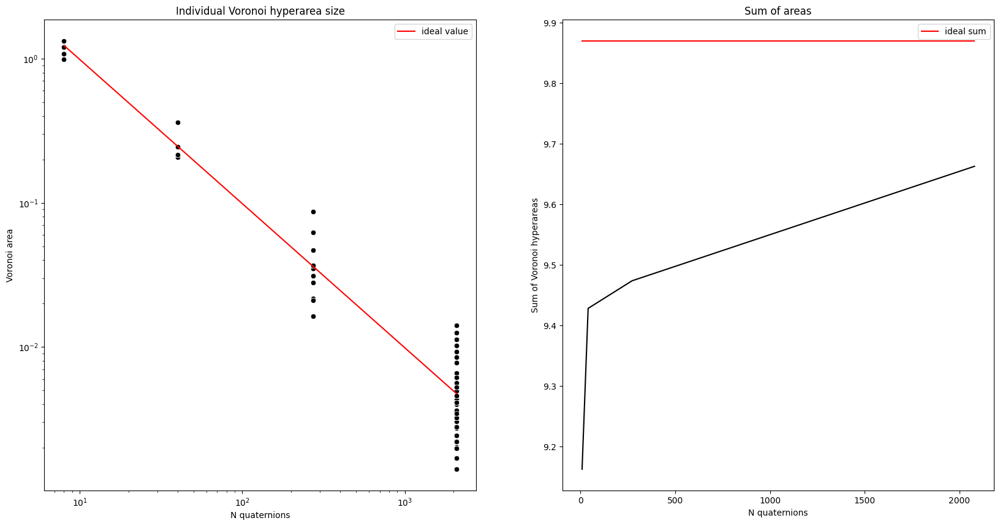

In [79]:
# testing convergence

# TODO: this so far works only for perfect divisions, but I think it should work for all if we correctly identify
# single and double coverage points
all_Ns = []
all_areas = []
my_set_of_cube4Ds = ConvergenceSphereGridFactory("cube4D", 4, N_set=(8, 40, 272, 2080)).create()
for my_cube4D in my_set_of_cube4Ds:
    my_quaternions = my_cube4D.get_grid_as_array()     #  no double coverage
    all_hypercube_points = [my_cube4D.polytope.G.nodes[n]['projection'] for n in my_cube4D.polytope.G.nodes()]
    # find indices of quaternions among all hypercube points
    q_index2full_index = dict()
    for q_index, q in enumerate(my_quaternions):
        full_index = np.where(np.all(np.isclose(q, all_hypercube_points), axis=1))[0][0]
        q_index2full_index[q_index] = full_index


    all_hypercube_areas = areas_on_sphere(np.array(all_hypercube_points), using_detailed_grid=True, print_estimate=False)
    my_areas = [all_hypercube_areas[q_index2full_index[i]] for i in range(len(my_quaternions))]

    
    
    #my_areas = areas_on_sphere(my_ico.get_grid_as_array(), using_detailed_grid=True, print_estimate=False)
    N = my_cube4D.get_N()
    all_Ns.append(N)
    all_areas.append(my_areas)
    print(f"For {N} points, average area is {np.average(my_areas)}, ideal would be {pi**2/N}")

# plotting
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
all_Ns = np.array(all_Ns)
for N, area in zip(all_Ns, all_areas):
    sns.scatterplot(x=N, y=area, color="black", ax=ax[0])
sns.lineplot(x=all_Ns, y=pi**2/all_Ns, color="red", label="ideal value", ax=ax[0])
ax[0].set_yscale("log")
ax[0].set_xscale("log")
ax[0].set_title("Individual Voronoi hyperarea size")
ax[1].set_title("Sum of areas")
sns.lineplot(x=all_Ns, y=[np.sum(x) for x in all_areas], color="black", ax=ax[1])
sns.lineplot(x=all_Ns, y=pi**2, color="red", label="ideal sum", ax=ax[1])
ax[0].set_xlabel("N quaternions")
ax[1].set_xlabel("N quaternions")
ax[0].set_ylabel("Voronoi area")
ax[1].set_ylabel("Sum of Voronoi hyperareas")
plt.show()

## Surface areas

Now that we know about volumes, we can consider surface areas between neighbours (surface lines for spheres).

When are two points neighbours? When they share two or more Voronoi vertices.

### Fast adjacency: Sphere

In [3]:
from molgri.space.polytopes import find_opposing_q

def adjacency_from_Voronoi_regions(voronoi_regions, num_dim=2, G=None):
    """
    2D: surfaces on a shphere
    3D: surfaces on a hypersphere + assumed quaternions; are also neighbours if the opposing point is neighbour
    """
    
    # prepare for adjacency matrix
    rows = []
    columns = []

    for index_tuple in combinations(list(range(len(voronoi_regions))), 2):

        set_1 = set(voronoi_regions[index_tuple[0]])
        set_2 = set(voronoi_regions[index_tuple[1]])
        
        if num_dim == 3:
            # assumed quaternion
            opposing_index_1 = find_opposing_q(index_tuple[0], G)
            opposing_index_2 = find_opposing_q(index_tuple[1], G)
            set_1 = set_1.union(set(voronoi_regions[opposing_index_1]))
            set_2 = set_2.union(set(voronoi_regions[opposing_index_2]))
        
        if len(set_1.intersection(set_2)) >= num_dim:
            rows.extend([index_tuple[0], index_tuple[1]])
            columns.extend([index_tuple[1], index_tuple[0]])
    return coo_array(([True,]*len(rows), (rows, columns)), dtype=bool)

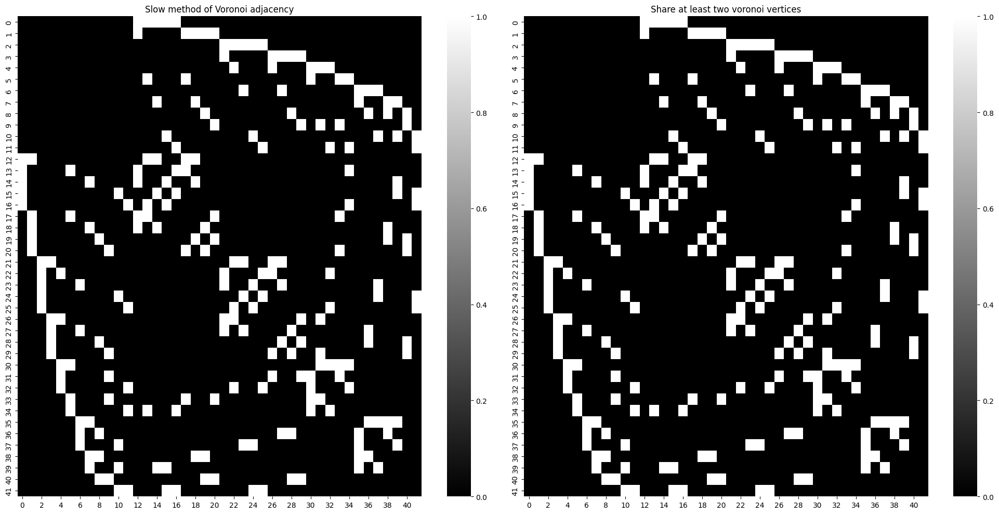

In [4]:
n_o = 42
n_b = 40
fg = FullGrid(f"fulldiv_{n_b}", f"ico_{n_o}",
              "[0.1]", use_saved=False)

example_3D_points = fg.o_positions
voronoi_cells_3d = SphericalVoronoi(example_3D_points)
voronoi_cells_3d.sort_vertices_of_regions()

all_regions = voronoi_cells_3d.regions

voronoi_adjacency = fg.get_adjacency_of_position_grid().toarray()
new_adjacency = adjacency_from_Voronoi_regions(all_regions).toarray()

fig, ax = plt.subplots(1, 2, figsize=(20,10))
sns.heatmap(voronoi_adjacency, cmap="gray", ax=ax[0])
ax[0].set_title("Slow method of Voronoi adjacency")
sns.heatmap(new_adjacency, cmap="gray", ax=ax[1])
ax[1].set_title("Share at least two voronoi vertices")
plt.tight_layout()
plt.show()

### Fast adjacency: Hypersphere

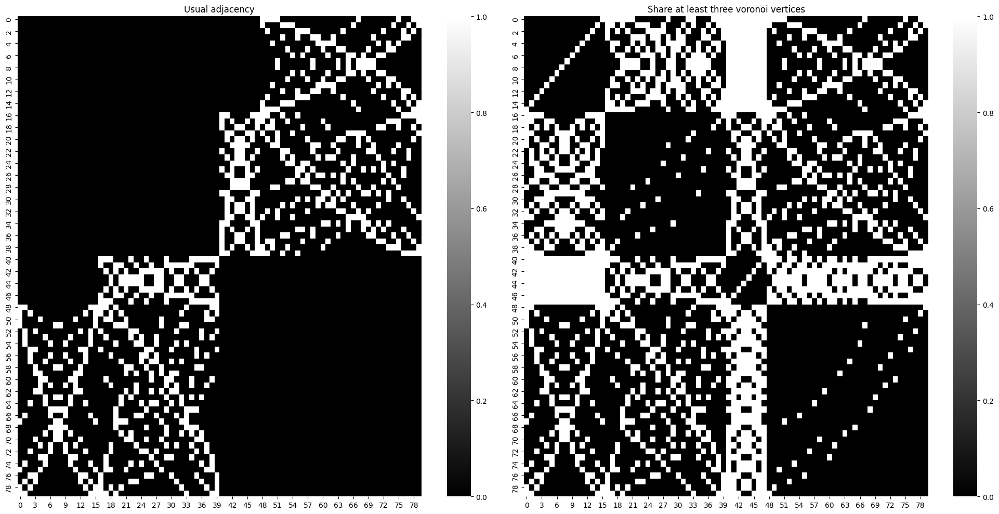

In [5]:
# sort nodes according to central index


central_indices = fg.b_rotations.polytope.select_half_of_hypercube(return_central_indices=True)
example_4D_points = np.array([d["projection"] for n, d in fg.b_rotations.polytope.G.nodes(data=True)])
voronoi_cells_4d = SphericalVoronoi(example_4D_points)
quaternions = fg.b_rotations.get_grid_as_array()

def hypersphere_ajd_2_quaternion_adj(central_indices, hypersphere_ajd):
    extracted_arr = np.empty_like((len(central_indices), len(central_indices)), dtype=bool)

    # Extract the specified rows and columns from the original array
    extracted_arr = hypersphere_ajd[central_indices, :]
    extracted_arr = extracted_arr[:, central_indices]
    return extracted_arr

all_regions = voronoi_cells_4d.regions

# TODO: need to add double coverage condition (also neighbour if your opposing point shares vertices)

voronoi_adjacency = fg.get_adjacency_of_orientation_grid()
voronoi_adjacency = fg.b_rotations.polytope.get_polytope_adj_matrix(include_opposing_neighbours=True,
                                                                 only_half_of_cube=False)

new_adjacency = adjacency_from_Voronoi_regions(all_regions, num_dim=3, G=fg.b_rotations.polytope.G).toarray()

#new_adjacency  = hypersphere_ajd_2_quaternion_adj(central_indices, new_adjacency)


fig, ax = plt.subplots(1, 2, figsize=(20,10))
sns.heatmap(voronoi_adjacency, cmap="gray", ax=ax[0])
ax[0].set_title("Usual adjacency")
sns.heatmap(new_adjacency, cmap="gray", ax=ax[1])
ax[1].set_title("Share at least three voronoi vertices")
plt.tight_layout()
plt.show()

### From adjacency to surface areas

In [50]:
from scipy.spatial.qhull import Delaunay

from sklearn.decomposition import PCA


def borders_approx_from_Voronoi_vertices(voronoi_vertices, voronoi_regions, num_dim=2, G=None):
    """
    2D: surfaces on a sphere; borders between them are curves (approx straight lines)
    3D: surfaces on a hypersphere; borders between them are surfaces (approx flat surfaces)
    """
    
    # prepare for adjacency matrix
    data = []
    rows = []
    columns = []

    for index_tuple in combinations(list(range(len(voronoi_regions))), 2):

        set_1 = set(voronoi_regions[index_tuple[0]])
        set_2 = set(voronoi_regions[index_tuple[1]])
        
        if num_dim == 3:
            # assumed quaternion
            opposing_index_1 = find_opposing_q(index_tuple[0], G)
            opposing_index_2 = find_opposing_q(index_tuple[1], G)
            #set_1 = set_1.union(set(voronoi_regions[opposing_index_1]))
            #set_2 = set_2.union(set(voronoi_regions[opposing_index_2]))
        
        neighbouring_vertices = list(set_1.intersection(set_2))
        if len(neighbouring_vertices) >= num_dim:
            # are neighbours
            if num_dim == 2:
                assert(len(neighbouring_vertices) == 2)
                surface = np.linalg.norm(voronoi_vertices[neighbouring_vertices[0]]-voronoi_vertices[neighbouring_vertices[1]])
            elif num_dim == 3:
                model = PCA(n_components=2).fit(voronoi_vertices[neighbouring_vertices])
                proj_vertices = model.transform(voronoi_vertices[neighbouring_vertices])
                surface = ConvexHull(proj_vertices).area/2
            data.extend([surface, surface])
            rows.extend([index_tuple[0], index_tuple[1]])
            columns.extend([index_tuple[1], index_tuple[0]])
    return coo_array((data, (rows, columns)), dtype=float)


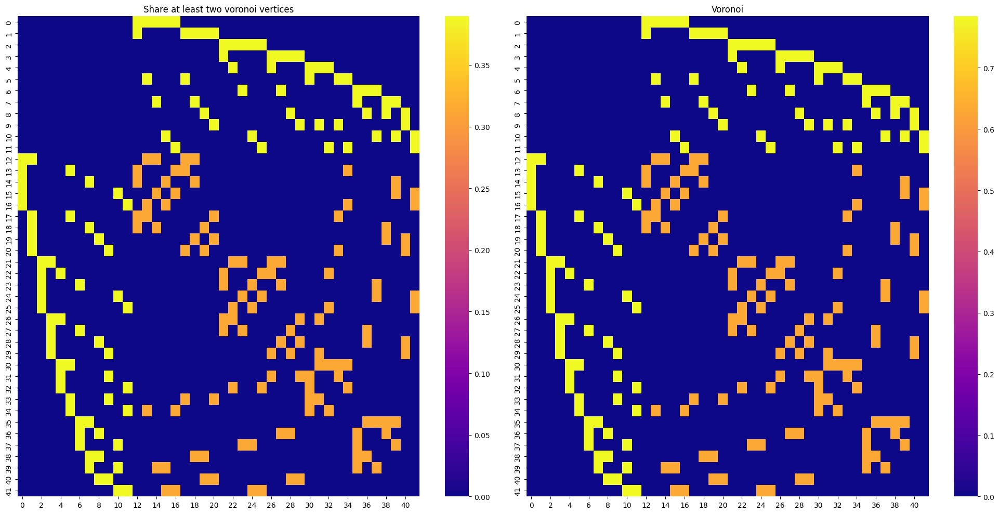

In [51]:
# 3d and comparison to reference
surfaces = borders_approx_from_Voronoi_vertices(voronoi_cells_3d.vertices, voronoi_cells_3d.regions).toarray()

fig, ax = plt.subplots(1, 2, figsize=(20,10))
sns.heatmap(surfaces, cmap="plasma", ax=ax[0])
ax[0].set_title("Share at least two voronoi vertices")
voronoi_surf = fg.get_full_voronoi_grid().get_all_voronoi_surfaces_as_numpy()
sns.heatmap(voronoi_surf, cmap="plasma", ax=ax[1])
ax[1].set_title("Voronoi")
plt.tight_layout()
plt.show()

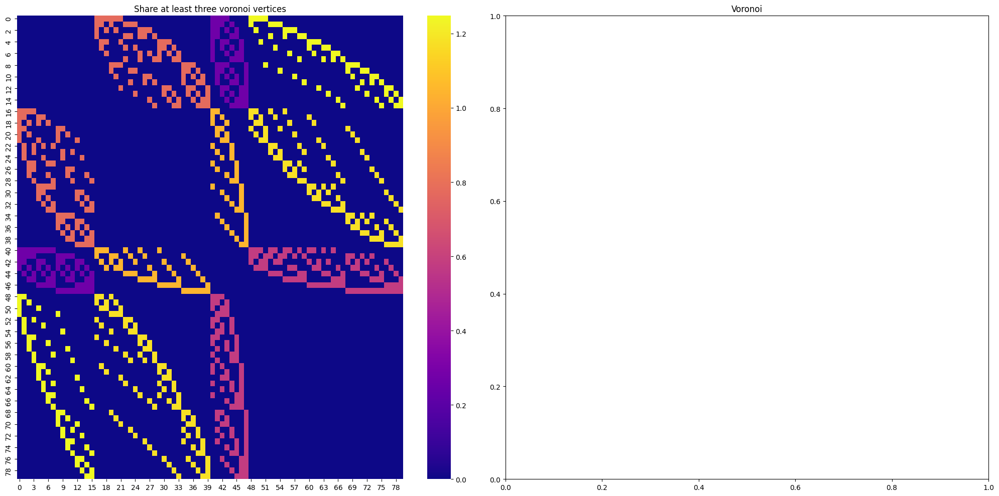

In [47]:
# 4d surfaces


surfaces_4d = borders_approx_from_Voronoi_vertices(voronoi_cells_4d.vertices, voronoi_cells_4d.regions,
                                                   num_dim=3, G=fg.b_rotations.polytope.G).toarray()

fig, ax = plt.subplots(1, 2, figsize=(20,10))
sns.heatmap(surfaces_4d, cmap="plasma", ax=ax[0])
ax[0].set_title("Share at least three voronoi vertices")
#voronoi_surf = fg.get_full_voronoi_grid().get_all_voronoi_surfaces_as_numpy()
#sns.heatmap(voronoi_surf, cmap="plasma", ax=ax[1])
ax[1].set_title("Voronoi")
plt.tight_layout()
plt.show()

